In [0]:
from torchvision import models
from deepdream import*
from PIL import Image

### Load model and define device

In [0]:
model = models.vgg16(pretrained=True)
device = torch.device("cuda")
model.to(device)
print(model)

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.torch/models/vgg16-397923af.pth
100%|██████████| 553433881/553433881 [00:20<00:00, 27078128.20it/s]


VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (17): Conv2d

### Initialize deep dream

In [0]:
dd = DeepDream(model,device)

### Define  module and function we want to maximize.

In [0]:
module = list(model.modules())[26]
module

Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))

In [0]:
def loss(module_output):
    return module_output[:,:,:,:].norm()

In [0]:
dd.module = module
dd.loss = loss

### Image generation

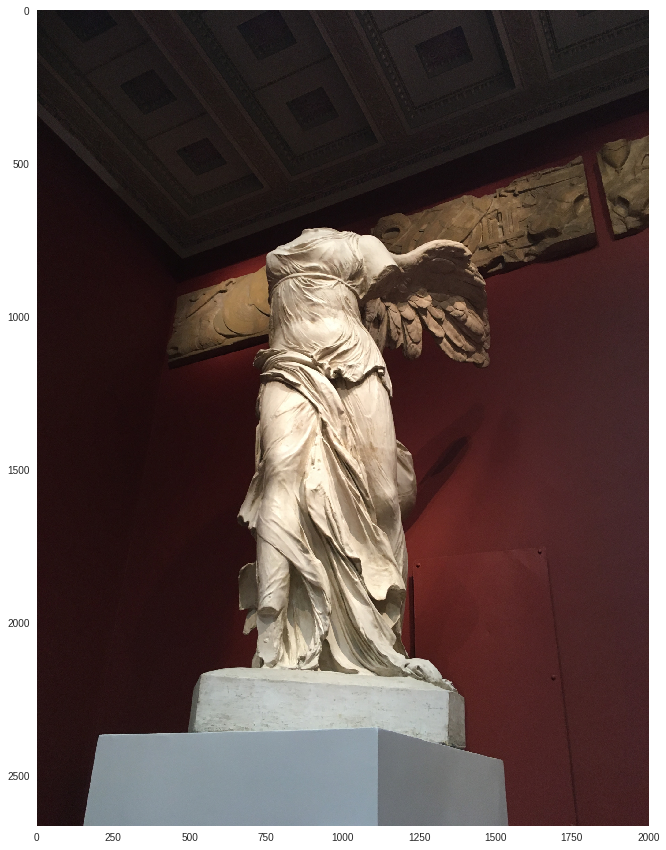

In [2]:
plt.rcParams['figure.figsize'] = 15,15 
plt.rcParams['axes.grid'] = False
image = Image.open('IMG.jpg')
plt.imshow(image)
plt.show()

Processing image: . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . 

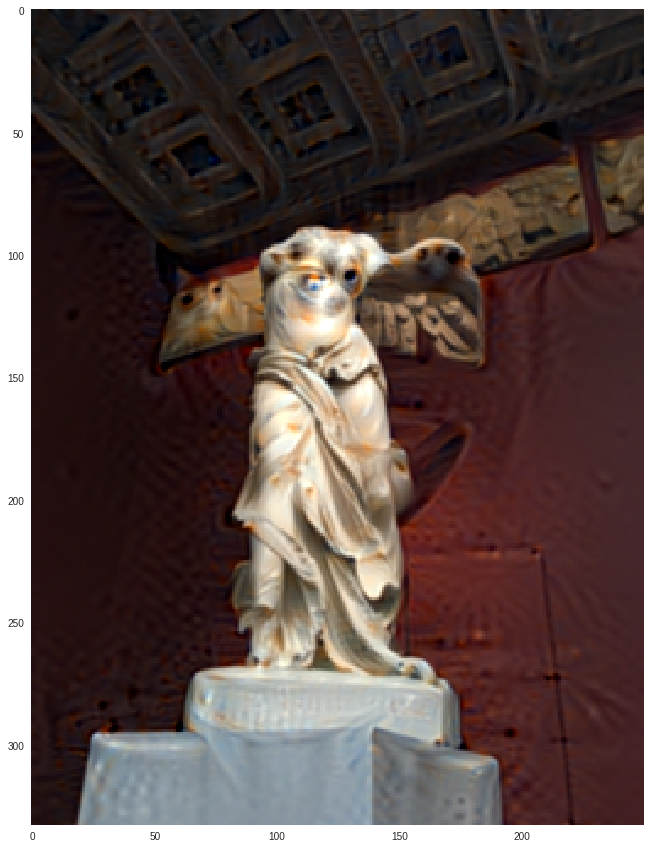

Processing image: . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . 

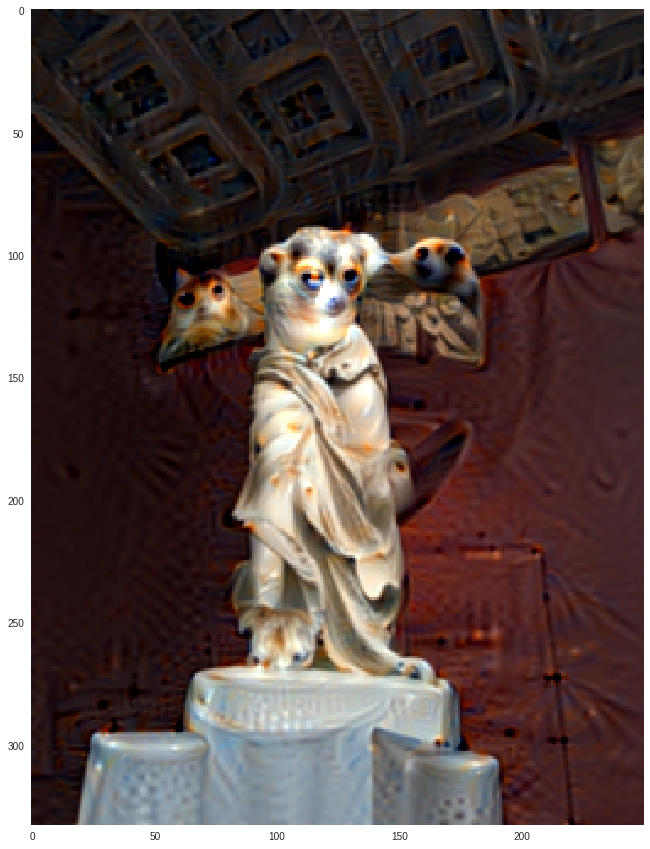

Processing image: . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . 

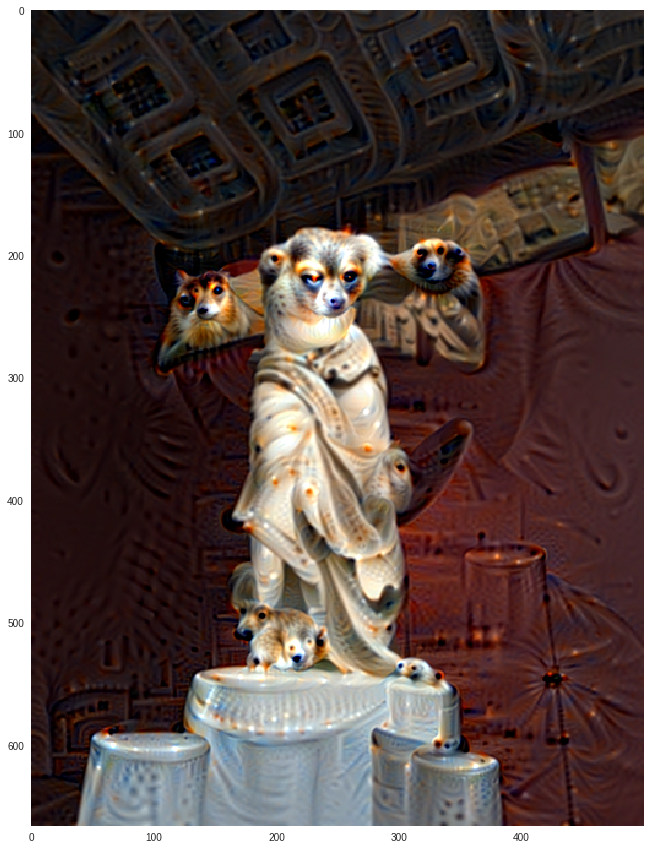

Processing image: . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . 

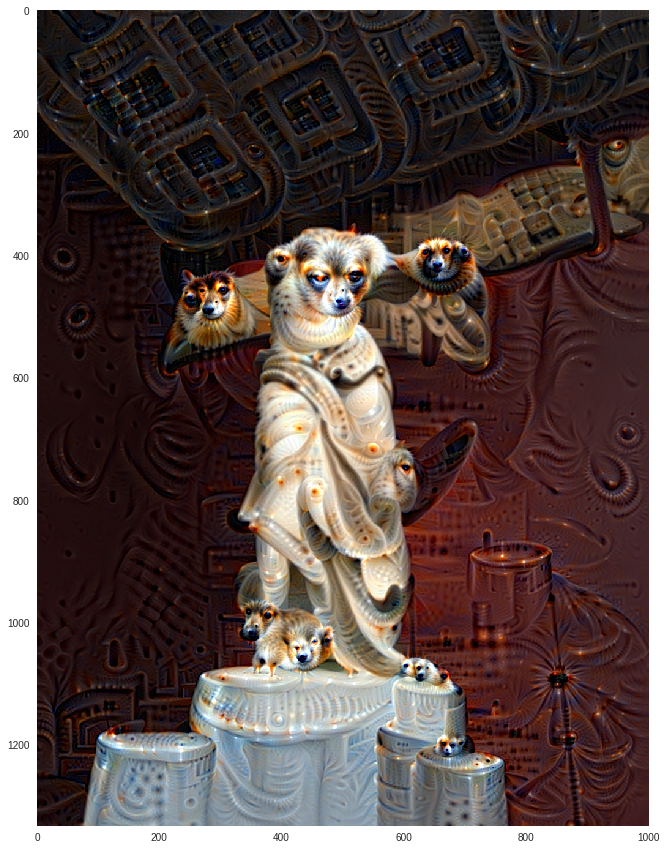

In [0]:
img_result = dd.render_multiscale(image,octave_n=4, octave_scale=0.5, blend=0.1, blur_radius=1, sigma=0.8, iter_n=30, step=0.01, pad=10,tile_size=800)

In [0]:
module = list(model.modules())[28]
module

Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))

In [0]:
def loss(module_output):
    return module_output[:,390].norm()
dd.module = module
dd.loss = loss

Processing image: . . . . . . . . . . . . . . . . . . . . 

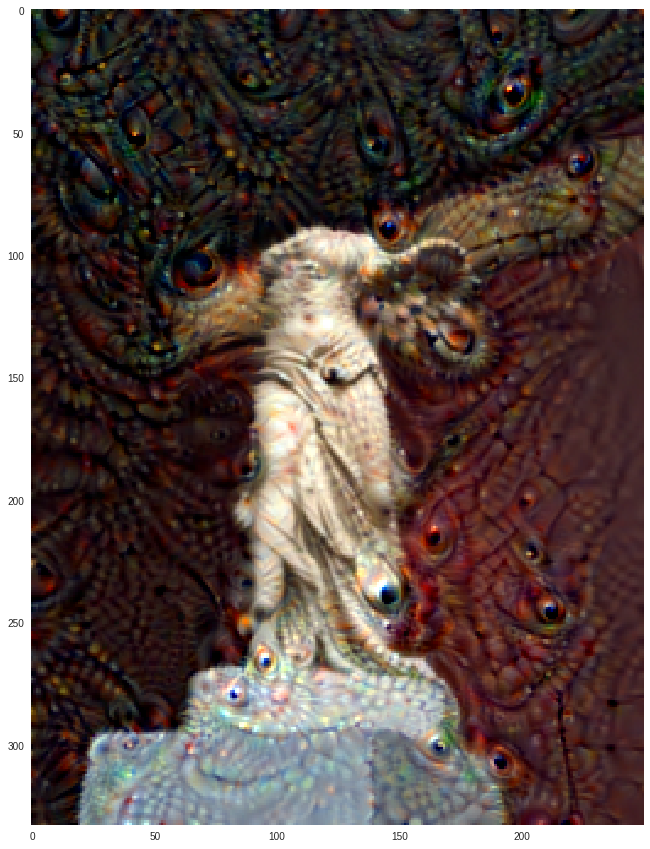

Processing image: . . . . . . . . . . . . . . . . . . . . 

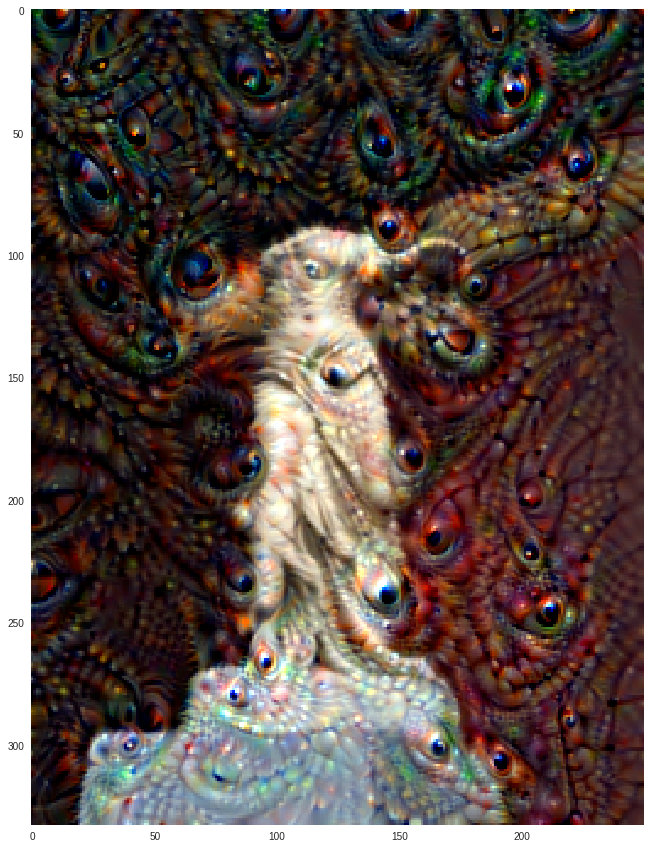

Processing image: . . . . . . . . . . . . . . . . . . . . 

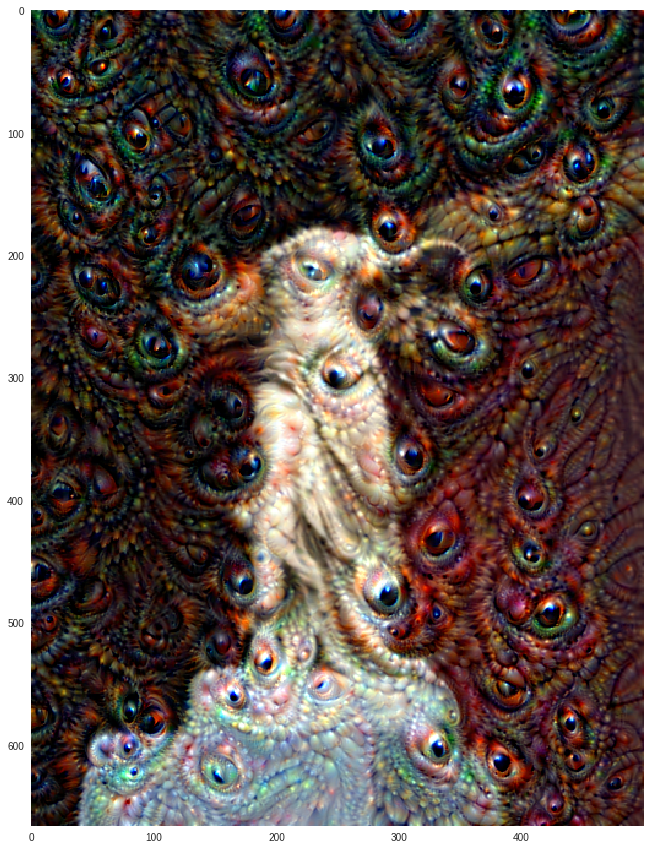

Processing image: . . . . . . . . . . . . . . . . . . . . 

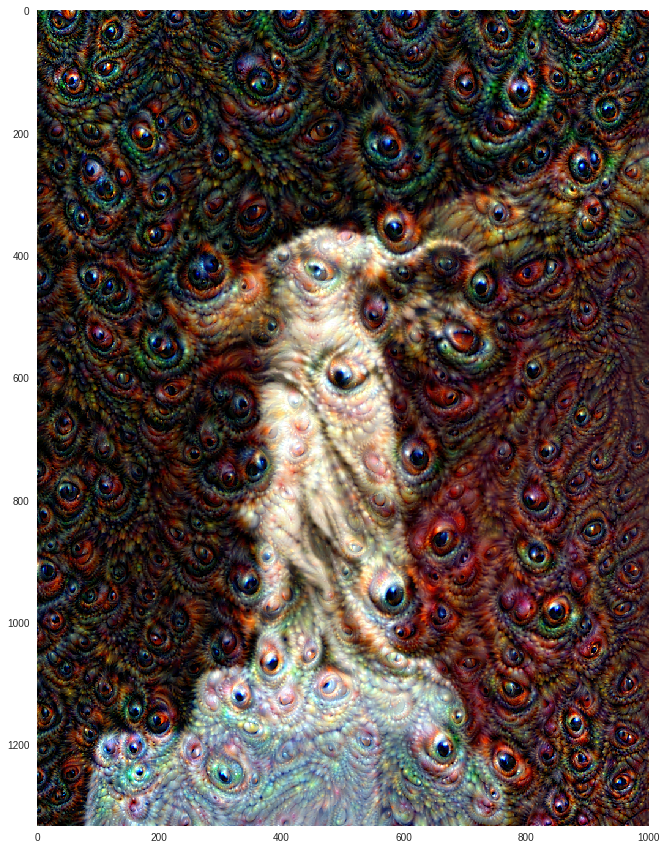

In [0]:
img_result = dd.render_multiscale(image,octave_n=4, octave_scale=0.5, blend=0.1, blur_radius=1, sigma=0.5, iter_n=20, step=0.02, pad=10,tile_size=500)

```

```

```

```

```

```

```

```

```

```

The image is splitted into smaller tiles and each tile gradient is computed independently. Besides random shifts I use padding to avoid tile gradient seams and hopefully this improves the image quality. With some models the seams can be quite distinguishable.

In [18]:
model = models.inception.inception_v3(pretrained=True,  # load existing weights
                     transform_input=False, # preprocess input image the same way as in training
                    )

model.aux_logits= False
model.train(False)
device = torch.device("cuda")
model.to(device)
module = model.Mixed_5d.branch3x3dbl_2.conv
module

Conv2d(64, 96, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)

In [0]:
dd = DeepDream(model,device)
def loss(module_output):
    return module_output[:,0,:,:].mean()
dd.module = module
dd.loss = loss

In [0]:
image_tensor = to_tensor(image,dd.device)
plt.rcParams['figure.figsize'] = 8,8 

**Without padding**

Processing image: Gradient min: -19.718668, max: 16.274172


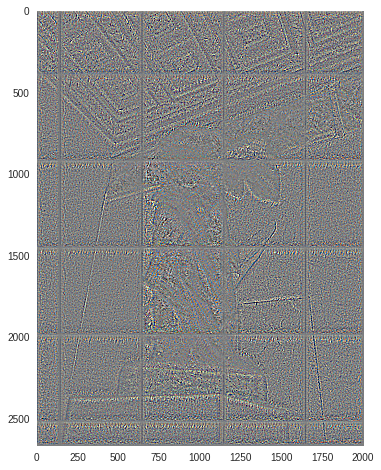

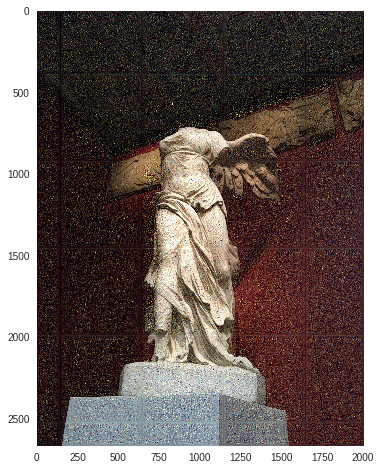

In [21]:
img_result = dd.render_image(image_tensor, sigma=0.5, iter_n=1, step=0.1, pad=0, tile_size=500,show_gradient=True,show_images=True)

**With padding**

Processing image: Gradient min: -18.722183, max: 18.674314


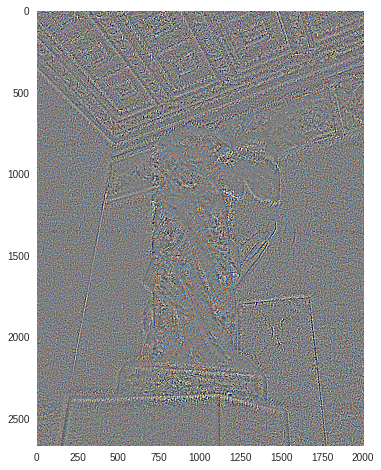

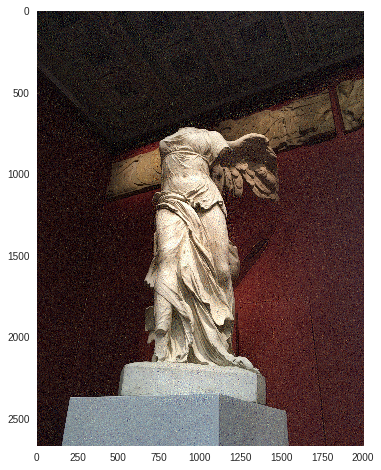

In [25]:
img_result = dd.render_image(image_tensor, sigma=0.5, iter_n=1, step=0.05, pad=50, tile_size=500,show_gradient=True,show_images=True)